# <b>PRCP-1009
# <b>CAR SYMBOLING PREDICTION

# <b>BUSINESS PROBLEM

## <b>PROBLEM CONTEXT
<b>
    
- BASED ON GIVEN FEATURE AND MESUREMENT PREDICT THE PRICE

## <b>REGRESSION TASK

# <b>TASK 1
#### <b>PREPARE A COMPLETE DATA ANALYSIS REPORT ON THE GIVEN DATA.

# <b>TASK 2
#### <b>Prepare the data, identifying and extracting key features (both input and output parameters) relevant to the problem you will solve.
#### <b>Build and train a machine learning model. Here you can evaluate different algorithms, settings and see which model is best for your scenario

### <b>TYPES OF MACHINE LEARNING PROBLEM.
- <b>Regression is a supervised learning technique where the goal is to predict a continuous numerical value for each data point, based on labeled training data consisting of input features and their corresponding real-valued outputs.<br>
### <b>ALGORITHM USES FOR REGRESSION
<b>
    
- Linear Regression
- KNN
- RANDOM FOREST
- SUPPORT VECTOR REGRESSOR
- DECISION TREE
- GRADIENT BOOST
- XGBOOST

# <b>TASK 1
#### <b>PREPARE A COMPLETE DATA ANALYSIS REPORT ON THE GIVEN DATA.

##  <b>IMPORTING LIBRARIES AND LOAD DATA

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

from ydata_profiling import ProfileReport

from sklearn.preprocessing import StandardScaler,LabelEncoder,OneHotEncoder,OrdinalEncoder
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import FunctionTransformer

import pickle
from sklearn.pipeline import Pipeline

from sklearn.linear_model import LinearRegression
from sklearn import preprocessing
import warnings
warnings.filterwarnings('ignore')

In [215]:
df=pd.read_csv("CarPriceprediction.csv")

In [216]:
# For displaying all feature from dataset:
pd.pandas.set_option('display.max_columns', None)

## <b>BASIC CHECKS

In [217]:
#Check the dataset values
df

,car_ID,symboling,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,carlength,carwidth,carheight,curbweight,enginetype,cylindernumber,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
0,1,3,alfa-romero giulia,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495.0
1,2,3,alfa-romero stelvio,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500.0
2,3,1,alfa-romero Quadrifoglio,gas,std,two,hatchback,rwd,front,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500.0
3,4,2,audi 100 ls,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950.0
4,5,2,audi 100ls,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
200,201,-1,volvo 145e (sw),gas,std,four,sedan,rwd,front,109.1,188.8,68.9,55.5,2952,ohc,four,141,mpfi,3.78,3.15,9.5,114,5400,23,28,16845.0
201,202,-1,volvo 144ea,gas,turbo,four,sedan,rwd,front,109.1,188.8,68.8,55.5,3049,ohc,four,141,mpfi,3.78,3.15,8.7,160,5300,19,25,19045.0
202,203,-1,volvo 244dl,gas,std,four,sedan,rwd,front,109.1,188.8,68.9,55.5,3012,ohcv,six,173,mpfi,3.58,2.87,8.8,134,5500,18,23,21485.0
203,204,-1,volvo 246,diesel,turbo,four,sedan,rwd,front,109.1,188.8,68.9,55.5,3217,ohc,six,145,idi,3.01,3.40,23.0,106,4800,26,27,22470.0


In [218]:
#Display top 5 values
df.head()

,car_ID,symboling,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,carlength,carwidth,carheight,curbweight,enginetype,cylindernumber,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
0,1,3,alfa-romero giulia,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495.0
1,2,3,alfa-romero stelvio,gas,std,two,convertible,rwd,front,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500.0
2,3,1,alfa-romero Quadrifoglio,gas,std,two,hatchback,rwd,front,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500.0
3,4,2,audi 100 ls,gas,std,four,sedan,fwd,front,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950.0
4,5,2,audi 100ls,gas,std,four,sedan,4wd,front,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450.0


In [219]:
#Display bottom 5 values
df.tail()

,car_ID,symboling,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,carlength,carwidth,carheight,curbweight,enginetype,cylindernumber,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
200,201,-1,volvo 145e (sw),gas,std,four,sedan,rwd,front,109.1,188.8,68.9,55.5,2952,ohc,four,141,mpfi,3.78,3.15,9.5,114,5400,23,28,16845.0
201,202,-1,volvo 144ea,gas,turbo,four,sedan,rwd,front,109.1,188.8,68.8,55.5,3049,ohc,four,141,mpfi,3.78,3.15,8.7,160,5300,19,25,19045.0
202,203,-1,volvo 244dl,gas,std,four,sedan,rwd,front,109.1,188.8,68.9,55.5,3012,ohcv,six,173,mpfi,3.58,2.87,8.8,134,5500,18,23,21485.0
203,204,-1,volvo 246,diesel,turbo,four,sedan,rwd,front,109.1,188.8,68.9,55.5,3217,ohc,six,145,idi,3.01,3.40,23.0,106,4800,26,27,22470.0
204,205,-1,volvo 264gl,gas,turbo,four,sedan,rwd,front,109.1,188.8,68.9,55.5,3062,ohc,four,141,mpfi,3.78,3.15,9.5,114,5400,19,25,22625.0


In [220]:
#Checks null values in all columns
df.isnull().sum()

car_ID              0
symboling           0
CarName             0
fueltype            0
aspiration          0
doornumber          0
carbody             0
drivewheel          0
enginelocation      0
wheelbase           0
carlength           0
carwidth            0
carheight           0
curbweight          0
enginetype          0
cylindernumber      0
enginesize          0
fuelsystem          0
boreratio           0
stroke              0
compressionratio    0
horsepower          0
peakrpm             0
citympg             0
highwaympg          0
price               0
dtype: int64

In [221]:
#Checks duplicate values in all columns
df.duplicated().sum()

0

In [222]:
#Display Statistics info about numerical data
df.describe()

,car_ID,symboling,wheelbase,carlength,carwidth,carheight,curbweight,enginesize,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
count,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000,205.000000
mean,103.000000,0.834146,98.756585,174.049268,65.907805,53.724878,2555.565854,126.907317,3.329756,3.255415,10.142537,104.117073,5125.121951,25.219512,30.751220,13276.710571
std,59.322565,1.245307,6.021776,12.337289,2.145204,2.443522,520.680204,41.642693,0.270844,0.313597,3.972040,39.544167,476.985643,6.542142,6.886443,7988.852332
min,1.000000,-2.000000,86.600000,141.100000,60.300000,47.800000,1488.000000,61.000000,2.540000,2.070000,7.000000,48.000000,4150.000000,13.000000,16.000000,5118.000000
25%,52.000000,0.000000,94.500000,166.300000,64.100000,52.000000,2145.000000,97.000000,3.150000,3.110000,8.600000,70.000000,4800.000000,19.000000,25.000000,7788.000000
50%,103.000000,1.000000,97.000000,173.200000,65.500000,54.100000,2414.000000,120.000000,3.310000,3.290000,9.000000,95.000000,5200.000000,24.000000,30.000000,10295.000000
75%,154.000000,2.000000,102.400000,183.100000,66.900000,55.500000,2935.000000,141.000000,3.580000,3.410000,9.400000,116.000000,5500.000000,30.000000,34.000000,16503.000000
max,205.000000,3.000000,120.900000,208.100000,72.300000,59.800000,4066.000000,326.000000,3.940000,4.170000,23.000000,288.000000,6600.000000,49.000000,54.000000,45400.000000


In [223]:
#Display Statistics info about categorical data
df.describe(include = "O")

,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,enginetype,cylindernumber,fuelsystem
count,205,205,205,205,205,205,205,205,205,205
unique,147,2,2,2,5,3,2,7,7,8
top,toyota corona,gas,std,four,sedan,fwd,front,ohc,four,mpfi
freq,6,185,168,115,96,120,202,148,159,94


#### <b>Insights
- Total 205 rows with 26 columns
- Their is not null values<br>
<b>Car Dimensions:
- The average wheelbase is 98.76 inches, ranging from 86.6 to 120.9 inches.
- The average car length is 174 inches, with a minimum of 141.1 inches and a maximum of 208.1 inches.
- The average car width is 65.9 inches, while the tallest car is 59.8 inches.<br>
<b>Engine & Performance:
- The average engine size is 126.9 cubic inches, ranging from 61 to 326 cubic inches.
- The average horsepower is 104 HP, with a max of 288 HP.
- The peak RPM varies between 4150 and 6600 RPM, with an average of 5125 RPM.<br>
<b>Fuel Efficiency:
- The average city mileage is 25.2 MPG, ranging from 13 to 49 MPG.
- The highway mileage averages 30.7 MPG, with a max of 54 MPG.<br>
<b>Car Pricing:
- The average car price is 13,276, but prices range from 5,118 to 45,400.
- The standard deviation is $7,989, indicating a wide variation in car prices.<br>
<b>Weight & Structure:
- The average curb weight is 2,555 lbs, ranging from 1,488 to 4,066 lbs.
- Bore ratio (cylinder bore size) averages 3.33, impacting engine efficiency.<br>

In [224]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 205 entries, 0 to 204
Data columns (total 26 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   car_ID            205 non-null    int64  
 1   symboling         205 non-null    int64  
 2   CarName           205 non-null    object 
 3   fueltype          205 non-null    object 
 4   aspiration        205 non-null    object 
 5   doornumber        205 non-null    object 
 6   carbody           205 non-null    object 
 7   drivewheel        205 non-null    object 
 8   enginelocation    205 non-null    object 
 9   wheelbase         205 non-null    float64
 10  carlength         205 non-null    float64
 11  carwidth          205 non-null    float64
 12  carheight         205 non-null    float64
 13  curbweight        205 non-null    int64  
 14  enginetype        205 non-null    object 
 15  cylindernumber    205 non-null    object 
 16  enginesize        205 non-null    int64  
 1

#### <b>Insights
The dataset contains 205 entries (rows) and 26 columns (features)<br>
There are no missing values (all columns have 205 non-null entries)<br>
Numeric Columns (16 total) and Categorical Columns (10 total)<br>
car_ID has a unique identifier for each row<br>
The dataset occupies 41.8 KB memory<br>


In [225]:
df.shape

(205, 26)

In [226]:
df.columns

Index(['car_ID', 'symboling', 'CarName', 'fueltype', 'aspiration',
       'doornumber', 'carbody', 'drivewheel', 'enginelocation', 'wheelbase',
       'carlength', 'carwidth', 'carheight', 'curbweight', 'enginetype',
       'cylindernumber', 'enginesize', 'fuelsystem', 'boreratio', 'stroke',
       'compressionratio', 'horsepower', 'peakrpm', 'citympg', 'highwaympg',
       'price'],
      dtype='object')

In [227]:
df.dtypes

car_ID                int64
symboling             int64
CarName              object
fueltype             object
aspiration           object
doornumber           object
carbody              object
drivewheel           object
enginelocation       object
wheelbase           float64
carlength           float64
carwidth            float64
carheight           float64
curbweight            int64
enginetype           object
cylindernumber       object
enginesize            int64
fuelsystem           object
boreratio           float64
stroke              float64
compressionratio    float64
horsepower            int64
peakrpm               int64
citympg               int64
highwaympg            int64
price               float64
dtype: object

In [228]:
#Check unique values in all columns to decide which column to drop

for column in df.columns:
    unique_values_length = len(df[column].unique())
    print(column,": ",unique_values_length)

car_ID :  205
symboling :  6
CarName :  147
fueltype :  2
aspiration :  2
doornumber :  2
carbody :  5
drivewheel :  3
enginelocation :  2
wheelbase :  53
carlength :  75
carwidth :  44
carheight :  49
curbweight :  171
enginetype :  7
cylindernumber :  7
enginesize :  44
fuelsystem :  8
boreratio :  38
stroke :  37
compressionratio :  32
horsepower :  59
peakrpm :  23
citympg :  29
highwaympg :  30
price :  189


#### <b>Insights
Here Car_ID column consist 205 values which is equal to total values so we can drop that column

In [229]:
df.drop(['car_ID'],axis=1,inplace=True)

In [230]:
df.columns

Index(['symboling', 'CarName', 'fueltype', 'aspiration', 'doornumber',
       'carbody', 'drivewheel', 'enginelocation', 'wheelbase', 'carlength',
       'carwidth', 'carheight', 'curbweight', 'enginetype', 'cylindernumber',
       'enginesize', 'fuelsystem', 'boreratio', 'stroke', 'compressionratio',
       'horsepower', 'peakrpm', 'citympg', 'highwaympg', 'price'],
      dtype='object')

## <b>EXPLORATORY DATA ANALYSIS (EDA)

In [231]:
profile=ProfileReport(df,title="EDA",explorative=True)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████████████████████████████████████████████████████████████████████████████| 25/25 [00:00<00:00, 72.01it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

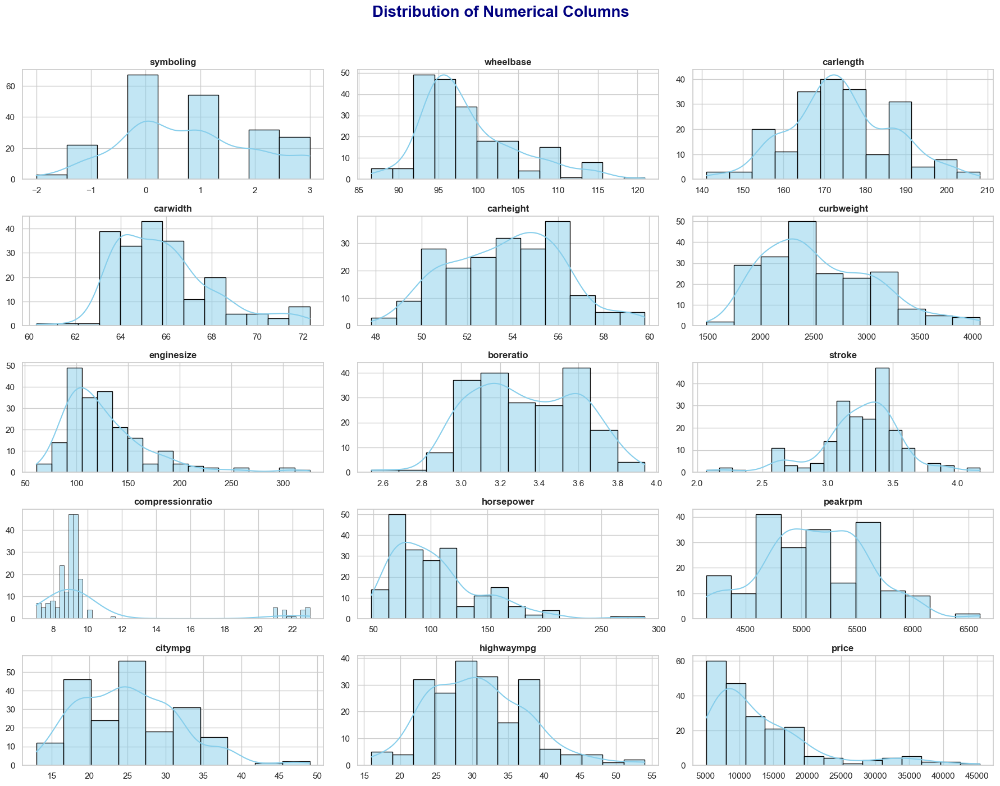

In [232]:
sns.set_style("whitegrid")
plt.figure(figsize=(18, 16))
plt.suptitle("Distribution of Numerical Columns", fontsize=20, fontweight='bold', color='navy', y=1.02)
numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns
total = len(numeric_cols)
for i, column in enumerate(numeric_cols, 1):
    plt.subplot((total // 3) + 1, 3, i)
    sns.histplot(df[column], kde=True, color='skyblue', edgecolor='black')
    plt.title(f'{column}', fontsize=12, fontweight='semibold')
    plt.xlabel('')
    plt.ylabel('')

plt.tight_layout()
plt.show()


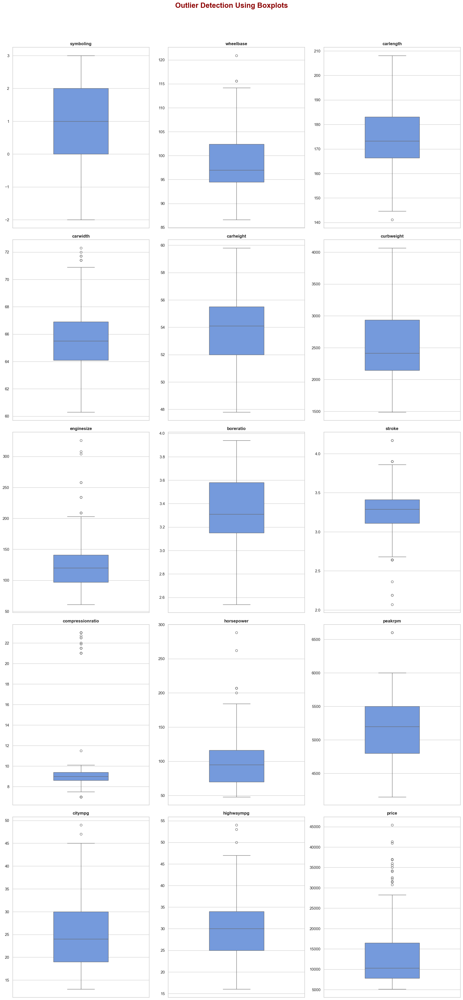

In [233]:
sns.set(style="whitegrid")
numerical_columns = df.select_dtypes(include=['int', 'float']).columns
total = len(numerical_columns)

plt.figure(figsize=(18, total * 3))
plt.suptitle('Outlier Detection Using Boxplots', fontsize=20, fontweight='bold', color='darkred', y=1.02)
for i, column in enumerate(numerical_columns, 1):
    plt.subplot((total // 3) + 1, 3, i)
    sns.boxplot(y=df[column], color='cornflowerblue', width=0.4)
    plt.title(f'{column}', fontsize=12, fontweight='semibold')
    plt.ylabel('')
    plt.xlabel('')
plt.tight_layout()
plt.show()

## <B>CORRELATION

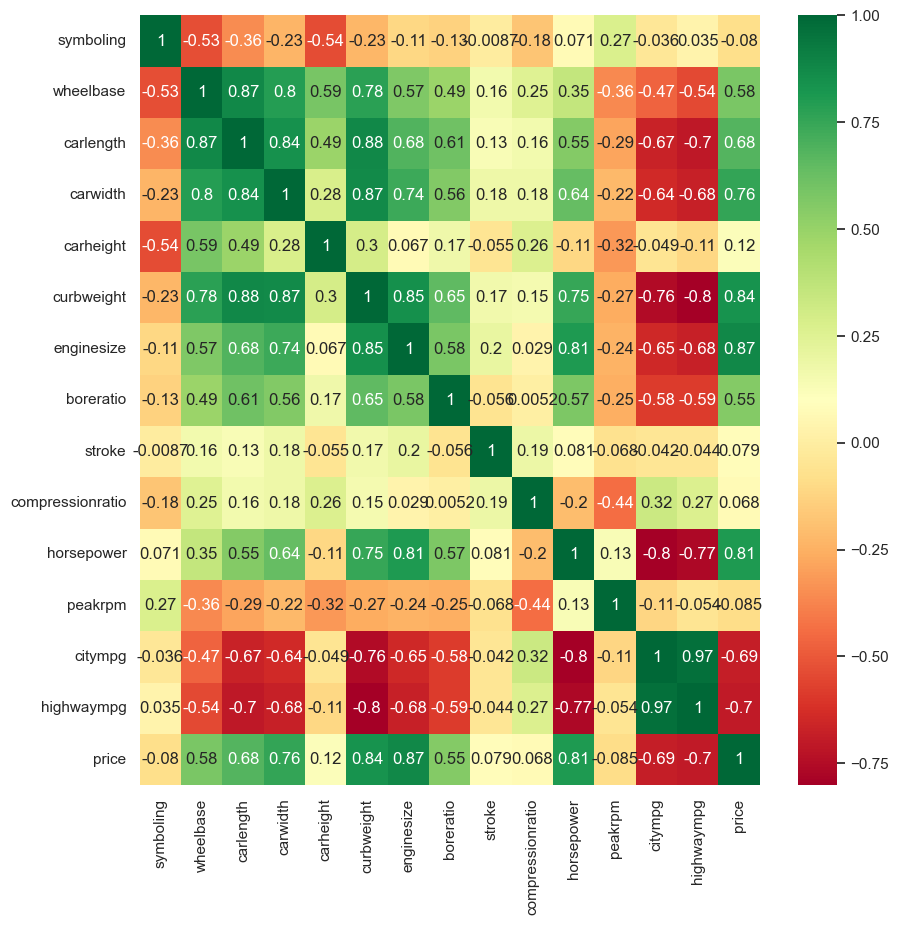

In [234]:
plt.figure(figsize=(10,10))
sns.heatmap(df.select_dtypes(include=['int', 'float']).corr(),cmap="RdYlGn",annot=True)
plt.show()

In [235]:
np.where(df.select_dtypes(include=['int', 'float']).corr()>0.9)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 12, 13, 13, 14],
       dtype=int64),
 array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 12, 13, 14],
       dtype=int64))

#### <b>Insights
- There is a high correlation between citympg and highwaympg hence the highwaympg column can be dropped.

In [236]:
df.drop(['highwaympg'],axis=1,inplace=True)

In [237]:
df.columns

Index(['symboling', 'CarName', 'fueltype', 'aspiration', 'doornumber',
       'carbody', 'drivewheel', 'enginelocation', 'wheelbase', 'carlength',
       'carwidth', 'carheight', 'curbweight', 'enginetype', 'cylindernumber',
       'enginesize', 'fuelsystem', 'boreratio', 'stroke', 'compressionratio',
       'horsepower', 'peakrpm', 'citympg', 'price'],
      dtype='object')

## <B>DATA PREPROCESSING

In [238]:
numerical_columns

Index(['symboling', 'wheelbase', 'carlength', 'carwidth', 'carheight',
       'curbweight', 'enginesize', 'boreratio', 'stroke', 'compressionratio',
       'horsepower', 'peakrpm', 'citympg', 'highwaympg', 'price'],
      dtype='object')

In [239]:
df[['symboling', 'wheelbase', 'carlength', 'carwidth', 'carheight',
       'curbweight', 'enginesize', 'boreratio', 'stroke', 'compressionratio',
       'horsepower', 'peakrpm', 'citympg', 'price']]

,symboling,wheelbase,carlength,carwidth,carheight,curbweight,enginesize,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,price
0,3,88.6,168.8,64.1,48.8,2548,130,3.47,2.68,9.0,111,5000,21,13495.0
1,3,88.6,168.8,64.1,48.8,2548,130,3.47,2.68,9.0,111,5000,21,16500.0
2,1,94.5,171.2,65.5,52.4,2823,152,2.68,3.47,9.0,154,5000,19,16500.0
3,2,99.8,176.6,66.2,54.3,2337,109,3.19,3.40,10.0,102,5500,24,13950.0
4,2,99.4,176.6,66.4,54.3,2824,136,3.19,3.40,8.0,115,5500,18,17450.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
200,-1,109.1,188.8,68.9,55.5,2952,141,3.78,3.15,9.5,114,5400,23,16845.0
201,-1,109.1,188.8,68.8,55.5,3049,141,3.78,3.15,8.7,160,5300,19,19045.0
202,-1,109.1,188.8,68.9,55.5,3012,173,3.58,2.87,8.8,134,5500,18,21485.0
203,-1,109.1,188.8,68.9,55.5,3217,145,3.01,3.40,23.0,106,4800,26,22470.0


In [240]:
numerical_columns=[['symboling', 'wheelbase', 'carlength', 'carwidth', 'carheight',
       'curbweight', 'enginesize', 'boreratio', 'stroke', 'compressionratio',
       'horsepower', 'peakrpm', 'citympg', 'price']]

In [241]:
numerical_columns

[['symboling',
  'wheelbase',
  'carlength',
  'carwidth',
  'carheight',
  'curbweight',
  'enginesize',
  'boreratio',
  'stroke',
  'compressionratio',
  'horsepower',
  'peakrpm',
  'citympg',
  'price']]

In [242]:
df.columns

Index(['symboling', 'CarName', 'fueltype', 'aspiration', 'doornumber',
       'carbody', 'drivewheel', 'enginelocation', 'wheelbase', 'carlength',
       'carwidth', 'carheight', 'curbweight', 'enginetype', 'cylindernumber',
       'enginesize', 'fuelsystem', 'boreratio', 'stroke', 'compressionratio',
       'horsepower', 'peakrpm', 'citympg', 'price'],
      dtype='object')

In [243]:
print("Total Count= ",len(df['CarName']))
print("Unique Value Count= ",len(df['CarName'].unique()))

Total Count=  205
Unique Value Count=  147


In [244]:
df['CarName'].unique()

array(['alfa-romero giulia', 'alfa-romero stelvio',
       'alfa-romero Quadrifoglio', 'audi 100 ls', 'audi 100ls',
       'audi fox', 'audi 5000', 'audi 4000', 'audi 5000s (diesel)',
       'bmw 320i', 'bmw x1', 'bmw x3', 'bmw z4', 'bmw x4', 'bmw x5',
       'chevrolet impala', 'chevrolet monte carlo', 'chevrolet vega 2300',
       'dodge rampage', 'dodge challenger se', 'dodge d200',
       'dodge monaco (sw)', 'dodge colt hardtop', 'dodge colt (sw)',
       'dodge coronet custom', 'dodge dart custom',
       'dodge coronet custom (sw)', 'honda civic', 'honda civic cvcc',
       'honda accord cvcc', 'honda accord lx', 'honda civic 1500 gl',
       'honda accord', 'honda civic 1300', 'honda prelude',
       'honda civic (auto)', 'isuzu MU-X', 'isuzu D-Max ',
       'isuzu D-Max V-Cross', 'jaguar xj', 'jaguar xf', 'jaguar xk',
       'maxda rx3', 'maxda glc deluxe', 'mazda rx2 coupe', 'mazda rx-4',
       'mazda glc deluxe', 'mazda 626', 'mazda glc', 'mazda rx-7 gs',
       'mazda glc 

<b>Here, In CarName Column total values Consist 205 and unique values consist 147, we cant drop this column as its important column for prediction and its hard to encode using multiple methods so insted of dropping column we will make some changes in it.

In [245]:
df['Company']=df.CarName.str.split(expand=True)[0]   #We split the Carname and return first value (index 0)

In [246]:
df['Company'].unique()

array(['alfa-romero', 'audi', 'bmw', 'chevrolet', 'dodge', 'honda',
       'isuzu', 'jaguar', 'maxda', 'mazda', 'buick', 'mercury',
       'mitsubishi', 'Nissan', 'nissan', 'peugeot', 'plymouth', 'porsche',
       'porcshce', 'renault', 'saab', 'subaru', 'toyota', 'toyouta',
       'vokswagen', 'volkswagen', 'vw', 'volvo'], dtype=object)

In [247]:
del df['CarName']

In [248]:
df.columns

Index(['symboling', 'fueltype', 'aspiration', 'doornumber', 'carbody',
       'drivewheel', 'enginelocation', 'wheelbase', 'carlength', 'carwidth',
       'carheight', 'curbweight', 'enginetype', 'cylindernumber', 'enginesize',
       'fuelsystem', 'boreratio', 'stroke', 'compressionratio', 'horsepower',
       'peakrpm', 'citympg', 'price', 'Company'],
      dtype='object')

### <B>ENCODING
#### <b>CONVERSION OF CATEGORICAL COLUMNS TO NUMERICAL COLUMN

List of Categorial Columns

- fueltype
- aspiration
- doornumber
- carbody
- drivewheel
- enginelocation
- enginetype
- cylindernumber
- fuelsystem
- Company

#### <B>SELECTING ENCODING TECHNIQUES

In [249]:
df.symboling.value_counts()

symboling
 0    67
 1    54
 2    32
 3    27
-1    22
-2     3
Name: count, dtype: int64

<b>symboling Column<br></b>
We will use Label Encoder for this column

In [250]:
df.fueltype.value_counts()

fueltype
gas       185
diesel     20
Name: count, dtype: int64

<b>FuelType Column<br></b>
We will use Label Encoder for this column

In [251]:
df.aspiration.value_counts()

aspiration
std      168
turbo     37
Name: count, dtype: int64

<b>aspiration Column<br></b>
We will use Label Encoder for this column

In [252]:
df.doornumber.value_counts()

doornumber
four    115
two      90
Name: count, dtype: int64

<b>doornumber Column<br></b>
We will use Label Encoder for this column

In [253]:
df.carbody.value_counts()

carbody
sedan          96
hatchback      70
wagon          25
hardtop         8
convertible     6
Name: count, dtype: int64

<b>carbody Column<br></b>
We will use Label Encoder for this column

In [254]:
df.drivewheel.value_counts()

drivewheel
fwd    120
rwd     76
4wd      9
Name: count, dtype: int64

<b>drivewheel Column<br></b>
We will use Label Encoder for this column

In [255]:
df.enginelocation.value_counts()

enginelocation
front    202
rear       3
Name: count, dtype: int64

<b>enginelocation Column<br></b>
We will use Label Encoder for this column

In [256]:
df.Company.value_counts()

Company
toyota         31
nissan         17
mazda          15
honda          13
mitsubishi     13
subaru         12
peugeot        11
volvo          11
volkswagen      9
dodge           9
buick           8
bmw             8
audi            7
plymouth        7
saab            6
isuzu           4
porsche         4
alfa-romero     3
chevrolet       3
jaguar          3
vw              2
maxda           2
renault         2
toyouta         1
vokswagen       1
Nissan          1
mercury         1
porcshce        1
Name: count, dtype: int64

<b>Company Column<br></b>
We will use Label Encoder for this column

In [257]:
df.enginetype.value_counts()

enginetype
ohc      148
ohcf      15
ohcv      13
dohc      12
l         12
rotor      4
dohcv      1
Name: count, dtype: int64

<b>enginetype Column<br></b>
We will use Label Encoder for this column

In [258]:
df.cylindernumber.value_counts()

cylindernumber
four      159
six        24
five       11
eight       5
two         4
three       1
twelve      1
Name: count, dtype: int64

<b>cylindernumber Column<br></b>
We will use Label Encoder for this column

In [259]:
df.fuelsystem.value_counts()

fuelsystem
mpfi    94
2bbl    66
idi     20
1bbl    11
spdi     9
4bbl     3
mfi      1
spfi     1
Name: count, dtype: int64

<b>fuelsystem Column<br></b>
We will use Label Encoder for this column

In [260]:
df.columns

Index(['symboling', 'fueltype', 'aspiration', 'doornumber', 'carbody',
       'drivewheel', 'enginelocation', 'wheelbase', 'carlength', 'carwidth',
       'carheight', 'curbweight', 'enginetype', 'cylindernumber', 'enginesize',
       'fuelsystem', 'boreratio', 'stroke', 'compressionratio', 'horsepower',
       'peakrpm', 'citympg', 'price', 'Company'],
      dtype='object')

<b>The below columns are numerical columns having continuous values and hence we will apply Standard Scaler for all these columns<br>
List of numerical Columns
- 'wheelbase'
- 'carlength'
- 'carwidth'
- 'carheight'
- 'curbweight'
- 'enginesize'
- 'boreratio'
- 'stroke'
- 'compressionratio'
- 'horsepower'
- 'peakrpm'
- 'citympg'
- 'price'

In [261]:
df[['wheelbase', 'carlength', 'carwidth', 'carheight',
       'curbweight', 'enginesize', 'boreratio', 'stroke', 'compressionratio',
       'horsepower', 'peakrpm', 'citympg', 'price']]

,wheelbase,carlength,carwidth,carheight,curbweight,enginesize,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,price
0,88.6,168.8,64.1,48.8,2548,130,3.47,2.68,9.0,111,5000,21,13495.0
1,88.6,168.8,64.1,48.8,2548,130,3.47,2.68,9.0,111,5000,21,16500.0
2,94.5,171.2,65.5,52.4,2823,152,2.68,3.47,9.0,154,5000,19,16500.0
3,99.8,176.6,66.2,54.3,2337,109,3.19,3.40,10.0,102,5500,24,13950.0
4,99.4,176.6,66.4,54.3,2824,136,3.19,3.40,8.0,115,5500,18,17450.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
200,109.1,188.8,68.9,55.5,2952,141,3.78,3.15,9.5,114,5400,23,16845.0
201,109.1,188.8,68.8,55.5,3049,141,3.78,3.15,8.7,160,5300,19,19045.0
202,109.1,188.8,68.9,55.5,3012,173,3.58,2.87,8.8,134,5500,18,21485.0
203,109.1,188.8,68.9,55.5,3217,145,3.01,3.40,23.0,106,4800,26,22470.0


## <B>CREATING THE PREPROCESSING PIPELINE

In [262]:
len(df.columns)

24

In [263]:
label_encoder=[['symboling', 'fueltype', 'aspiration', 'doornumber', 'carbody',
       'drivewheel', 'enginelocation',  'enginetype', 'cylindernumber', 
       'fuelsystem', 'Company']]
standard_scaler=['wheelbase','carlength', 'carwidth',
       'carheight', 'curbweight', 'enginesize','boreratio', 'stroke', 'compressionratio', 'horsepower',
       'peakrpm', 'citympg']

In [264]:
class ModifiedLabelEncoder(LabelEncoder):
    def fit_transform(self, y, *args, **kwargs):
        return super().fit_transform(y).reshape(-1, 1)

    def transform(self, y, *args, **kwargs):
        return super().transform(y).reshape(-1, 1)

In [265]:
def same(x):
    return x

In [266]:
no_trans=FunctionTransformer(same)

In [267]:
preprocessor = ColumnTransformer([
    ("Label_encoder", ModifiedLabelEncoder(), label_encoder),
    ("Standard_scaler", StandardScaler(), standard_scaler)])

In [268]:
preprocessor

ColumnTransformer(transformers=[('Label_encoder', ModifiedLabelEncoder(),
                                 [['symboling', 'fueltype', 'aspiration',
                                   'doornumber', 'carbody', 'drivewheel',
                                   'enginelocation', 'enginetype',
                                   'cylindernumber', 'fuelsystem',
                                   'Company']]),
                                ('Standard_scaler', StandardScaler(),
                                 ['wheelbase', 'carlength', 'carwidth',
                                  'carheight', 'curbweight', 'enginesize',
                                  'boreratio', 'stroke', 'compressionratio',
                                  'horsepower', 'peakrpm', 'citympg'])])

In [269]:
file=open("Car_Price_Prediction.pkl","wb")

In [270]:
pickle.dump(preprocessor,file)

In [271]:
file.close()

In [272]:
label_encoder=preprocessing.LabelEncoder()
df['symboling']=label_encoder.fit_transform(df['symboling'])
df['fueltype']=label_encoder.fit_transform(df['fueltype'])
df['aspiration']=label_encoder.fit_transform(df['aspiration'])
df['doornumber']=label_encoder.fit_transform(df['doornumber'])
df['carbody']=label_encoder.fit_transform(df['carbody'])
df['drivewheel']=label_encoder.fit_transform(df['drivewheel'])
df['enginelocation']=label_encoder.fit_transform(df['enginelocation'])
df['Company']=label_encoder.fit_transform(df['Company'])

In [273]:
df.columns

Index(['symboling', 'fueltype', 'aspiration', 'doornumber', 'carbody',
       'drivewheel', 'enginelocation', 'wheelbase', 'carlength', 'carwidth',
       'carheight', 'curbweight', 'enginetype', 'cylindernumber', 'enginesize',
       'fuelsystem', 'boreratio', 'stroke', 'compressionratio', 'horsepower',
       'peakrpm', 'citympg', 'price', 'Company'],
      dtype='object')

## <B>MODEL SELECTION

### <B>LINEAR REGRESSION

In [274]:
x = df[['symboling', 'fueltype','doornumber', 'carbody','carheight', 'stroke', 'compressionratio', 'horsepower',
       'peakrpm','Company']]
y = df["price"]

In [275]:
x

,symboling,fueltype,doornumber,carbody,carheight,stroke,compressionratio,horsepower,peakrpm,Company
0,5,1,1,0,48.8,2.68,9.0,111,5000,1
1,5,1,1,0,48.8,2.68,9.0,111,5000,1
2,3,1,1,2,52.4,3.47,9.0,154,5000,1
3,4,1,0,3,54.3,3.40,10.0,102,5500,2
4,4,1,0,3,54.3,3.40,8.0,115,5500,2
...,...,...,...,...,...,...,...,...,...,...
200,1,1,0,3,55.5,3.15,9.5,114,5400,26
201,1,1,0,3,55.5,3.15,8.7,160,5300,26
202,1,1,0,3,55.5,2.87,8.8,134,5500,26
203,1,0,0,3,55.5,3.40,23.0,106,4800,26


In [276]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.25,random_state=33)

In [277]:
LR=LinearRegression()

In [278]:
LR.fit(x_train,y_train)

LinearRegression()

In [279]:
y_predict = LR.predict(x_test)
y_predict

array([11876.31042767, 25532.49013396, 10778.64298996, 12995.85641622,
       18671.22024768, 12808.83733036, 30081.06622167, 29714.74895382,
        4705.94239551, 12808.83733036, 14032.30576021, 22735.5509777 ,
        3853.54623427,  9509.56770672,  5206.82294447, 22616.71610729,
       14138.26990436,  7447.10690706,  5948.08678589, 12549.61823584,
       15962.30712468,  9593.02197594, 12607.89352383, 18015.878691  ,
       32007.92704288, 20653.18771015, 10702.06230624,  5277.7079519 ,
        5649.01884077, 12499.51850933,  5378.73843662, 26154.51895697,
       22027.35674535, 18257.61788463, 14138.26990436,  8957.28529967,
        7966.33541377,  5771.31515389,  9766.2240074 ,  5948.08678589,
       43346.46548869,  6255.49082451,  5084.71718852, 20290.92445403,
       22449.12837078,  8115.18466828,  9123.16376766,  6076.42588433,
        9904.78853447,  7062.83890307, 11348.3625248 , 11483.82132576])

In [280]:
LR.coef_

array([ 5.50836644e+01,  7.18395160e+03, -1.64729796e+03, -1.53037638e+03,
        6.10528780e+02, -1.31314387e+03,  9.43885170e+02,  1.81573167e+02,
       -1.84954205e+00, -2.65770832e+02])

In [281]:
LR.intercept_

-32355.69430872693

In [282]:
predict=LR.predict(x_test)
predict

array([11876.31042767, 25532.49013396, 10778.64298996, 12995.85641622,
       18671.22024768, 12808.83733036, 30081.06622167, 29714.74895382,
        4705.94239551, 12808.83733036, 14032.30576021, 22735.5509777 ,
        3853.54623427,  9509.56770672,  5206.82294447, 22616.71610729,
       14138.26990436,  7447.10690706,  5948.08678589, 12549.61823584,
       15962.30712468,  9593.02197594, 12607.89352383, 18015.878691  ,
       32007.92704288, 20653.18771015, 10702.06230624,  5277.7079519 ,
        5649.01884077, 12499.51850933,  5378.73843662, 26154.51895697,
       22027.35674535, 18257.61788463, 14138.26990436,  8957.28529967,
        7966.33541377,  5771.31515389,  9766.2240074 ,  5948.08678589,
       43346.46548869,  6255.49082451,  5084.71718852, 20290.92445403,
       22449.12837078,  8115.18466828,  9123.16376766,  6076.42588433,
        9904.78853447,  7062.83890307, 11348.3625248 , 11483.82132576])

#### <B>Model Evaluation

In [283]:
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error

In [284]:
MSE=mean_squared_error(y_test,predict)

In [285]:
MAE=mean_absolute_error(y_test,predict)

In [286]:
RMSE=np.sqrt(MSE)

In [287]:
R2=r2_score(y_test,y_predict)

In [288]:
LR.score(x_test,y_test)

0.7770058942144888

In [289]:
print(f'Mean Squared Error (MSE): {MSE}')
print(f'Root Mean Squared Error (RMSE): {RMSE}')
print(f'R-squared (R²): {R2}')

Mean Squared Error (MSE): 15428955.500114748
Root Mean Squared Error (RMSE): 3927.970913858038
R-squared (R²): 0.7770058942144888


#### Conclusion for Linear Regression
The objective of this linear regression analysis was to examine how various factors of car impact car prices.<br>
The model explains approximately 77% of the variation in car prices (R² = 0.77), indicating a strong fit to the data.

<b>Mean Squared Error (MSE): 15428955.500114748<br>
Root Mean Squared Error (RMSE): 3927.970913858038<br>
R-squared (R²): 0.7770058942144888

#### <B> Hyperparameter Tuning for linear regression

#### <B>For Ridge

In [290]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV
from sklearn.datasets import make_regression

In [291]:
x, y = make_regression(n_samples=100, n_features=3, noise=0.1, random_state=42)

In [292]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

In [293]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [294]:
ridge = Ridge()

In [295]:
param_grid = {
    'alpha': np.logspace(-6, 6, 13),  # Range of alpha values to try (from 1e-6 to 1e6)
    'solver': ['auto', 'svd', 'cholesky', 'lsqr', 'saga']  # Solvers for optimization
}

In [296]:
grid_search = GridSearchCV(ridge, param_grid, cv=5, scoring='neg_mean_squared_error', verbose=1)

In [297]:
grid_search.fit(X_train, y_train)

Fitting 5 folds for each of 65 candidates, totalling 325 fits


GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': array([1.e-06, 1.e-05, 1.e-04, 1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01,
       1.e+02, 1.e+03, 1.e+04, 1.e+05, 1.e+06]),
                         'solver': ['auto', 'svd', 'cholesky', 'lsqr', 'saga']},
             scoring='neg_mean_squared_error', verbose=1)

In [298]:
print(f"Best Hyperparameters: {grid_search.best_params_}")

Best Hyperparameters: {'alpha': 1e-05, 'solver': 'saga'}


#### <b>Evaluate the model:

In [299]:
X, y = make_regression(n_samples=100, n_features=1, noise=10, random_state=42)

In [300]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [301]:
alpha = 0.001
ridge_reg = Ridge(alpha=alpha, solver='saga')

In [302]:
ridge_reg.fit(X_train, y_train)

Ridge(alpha=0.001, solver='saga')

In [303]:
y_pred = ridge_reg.predict(X_test)

In [304]:
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

In [305]:
print(f'Mean Squared Error (MSE): {mse}')
print(f'Root Mean Squared Error (RMSE): {rmse}')
print(f'R-squared (R²): {r2}')

Mean Squared Error (MSE): 104.2037362417423
Root Mean Squared Error (RMSE): 10.208023130936876
R-squared (R²): 0.9374142540163521


#### Conclusion for Linear Regression using Ridge
The objective of this linear regression analysis using ridge was to examine how various factors of car impact car prices.<br>
The model explains approximately 93% of the variation in car prices (R² = 0.93)

<b>Mean Squared Error (MSE): 104.19402184082159<br>
Root Mean Squared Error (RMSE): 10.207547297995811<br>
R-squared (R²): 0.9374200885770918

#### <B>For Lasso

In [306]:
from sklearn.linear_model import Lasso
from sklearn.linear_model import LassoCV

In [307]:
X, y = make_regression(n_samples=100, n_features=1, noise=10, random_state=42)

In [308]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [309]:
lasso_cv = LassoCV(cv=5, random_state=42)  # 5-fold cross-validation

In [310]:
lasso_cv.fit(X_train, y_train)

LassoCV(cv=5, random_state=42)

In [311]:
best_alpha = lasso_cv.alpha_

In [312]:
print(f'Best alpha (regularization strength) found by cross-validation: {best_alpha}')

Best alpha (regularization strength) found by cross-validation: 0.03618269158564641


In [313]:
y_pred = lasso_cv.predict(X_test)

In [314]:
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)  
r2 = r2_score(y_test, y_pred)

In [315]:
print(f'Mean Squared Error (MSE): {mse}')
print(f'Root Mean Squared Error (RMSE): {rmse}')
print(f'R-squared (R²): {r2}')

Mean Squared Error (MSE): 104.28501977891304
Root Mean Squared Error (RMSE): 10.212003710286881
R-squared (R²): 0.9373654343579263


#### Conclusion for Linear Regression using LassoCV
The objective of this linear regression analysis using LassoCV was to examine how various factors of car impact car prices.<br>
The model explains approximately 93% of the variation in car prices (R² = 0.93)

<b>Mean Squared Error (MSE): 104.28501977891304<br>
Root Mean Squared Error (RMSE): 10.212003710286881<br>
R-squared (R²): 0.9373654343579263

### CONCLUSION FOR LINEAR REGRESSION 
<b>Values of R-Square

- <b>Without using Hyperparameter = 77%
- <b>With Hyperparameter (Ridge) = 93.74%
- <b>With Hyperparameter (Lasso) = 93.73%

### <B>K-NEAREST NEIGHBOURS

In [316]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.neighbors import KNeighborsRegressor
from sklearn.datasets import make_regression

In [317]:
X = df[['symboling', 'fueltype','doornumber', 'carbody','carheight', 'stroke', 'compressionratio', 'horsepower',
       'peakrpm','Company']]
y = df['price']

In [318]:
scalar = StandardScaler()
X_scaled = scalar.fit_transform(X)

In [319]:
X_scaled

array([[ 1.74347043,  0.32879797,  1.13038833, ...,  0.17448278,
        -0.26296022, -1.80331069],
       [ 1.74347043,  0.32879797,  1.13038833, ...,  0.17448278,
        -0.26296022, -1.80331069],
       [ 0.133509  ,  0.32879797,  1.13038833, ...,  1.26453643,
        -0.26296022, -1.80331069],
       ...,
       [-1.47645244,  0.32879797, -0.88465174, ...,  0.75753473,
         0.78785546,  1.54401539],
       [-1.47645244, -3.04138127, -0.88465174, ...,  0.04773235,
        -0.68328649,  1.54401539],
       [-1.47645244,  0.32879797, -0.88465174, ...,  0.25053303,
         0.57769233,  1.54401539]])

In [320]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [321]:
X_train.shape

(164, 10)

In [322]:
k_values = range(1, 21)  # Try k values from 1 to 20
rmse_values = []
for k in k_values:
    knn = KNeighborsRegressor(n_neighbors=k)
    knn.fit(X_train, y_train)
    # Predict on the test set
    y_pred = knn.predict(X_test)
    # Calculate Mean Squared Error
    mse = mean_squared_error(y_test, y_pred)
    # Calculate RMSE (Root Mean Squared Error)
    rmse = np.sqrt(mse)
    # Append the RMSE value to the list
    rmse_values.append(rmse)

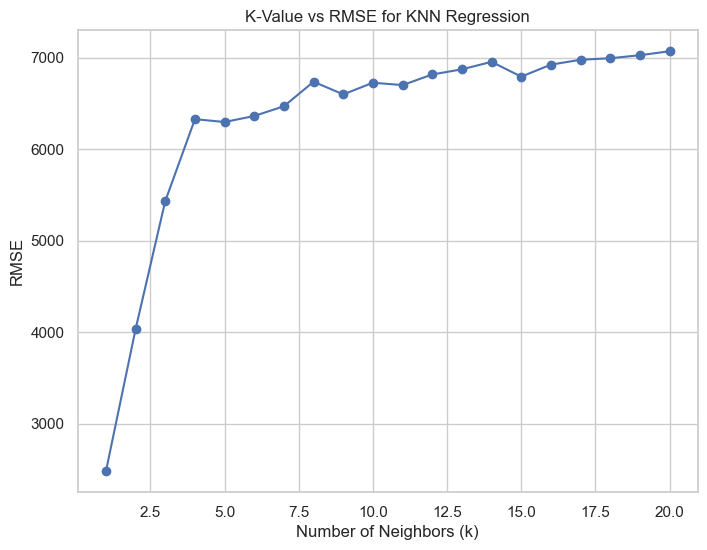

In [323]:
# Plot k-values vs RMSE
plt.figure(figsize=(8, 6))
plt.plot(k_values, rmse_values, marker='o', linestyle='-', color='b')
plt.title('K-Value vs RMSE for KNN Regression')
plt.xlabel('Number of Neighbors (k)')
plt.ylabel('RMSE')
plt.grid(True)
plt.show()

<b>Here From Above plot we can say that the optimal value of k should be 3

In [324]:
knn1 = KNeighborsRegressor(n_neighbors=3)
knn1.fit(X_train,y_train)

KNeighborsRegressor(n_neighbors=3)

In [325]:
y_pred = knn1.predict(X_test)
y_pred

array([25450.        , 20215.        ,  7765.66666667, 14240.        ,
       15659.33333333,  7149.        , 10412.66666667,  7678.        ,
        7932.33333333,  6814.        ,  9077.        ,  7871.33333333,
       15541.66666667, 10364.66666667, 23314.33333333,  6201.33333333,
        8428.33333333, 13532.33333333,  8845.33333333,  7932.33333333,
       10695.        , 14529.33333333,  7149.        ,  6261.66666667,
        6738.33333333, 25450.        , 10399.        , 18375.        ,
        7232.33333333, 18485.        , 15659.33333333,  6624.33333333,
        7014.66666667, 13525.33333333,  8753.        , 15659.33333333,
       11077.33333333, 10781.66666667,  7262.16666667, 13532.33333333,
        8124.        ])

In [326]:
y_test

15     30760.000
9      17859.167
100     9549.000
132    11850.000
68     28248.000
95      7799.000
159     7788.000
162     9258.000
147    10198.000
182     7775.000
191    13295.000
164     8238.000
65     18280.000
175     9988.000
73     40960.000
152     6488.000
18      5151.000
82     12629.000
86      8189.000
143     9960.000
60      8495.000
101    13499.000
98      8249.000
30      6479.000
25      6692.000
16     41315.000
168     9639.000
195    13415.000
97      7999.000
194    12940.000
67     25552.000
120     6229.000
154     7898.000
202    21485.000
79      7689.000
69     28176.000
145    11259.000
55     10945.000
45      8916.500
84     14489.000
146     7463.000
Name: price, dtype: float64

In [327]:
mse = mean_squared_error(y_test, y_pred)

rmse = np.sqrt(mse)
print(f"Root Mean Squared Error (RMSE): {rmse}")

r2 = r2_score(y_test, y_pred) # R-squared value
print(f"R-squared: {r2}")

mae = mean_absolute_error(y_test, y_pred) # Mean Absolute Error
print(f"Mean Absolute Error (MAE): {mae}")

Root Mean Squared Error (RMSE): 5431.5547191369
R-squared: 0.6262948563013928
Mean Absolute Error (MAE): 3264.0284471544715


#### Conclusion for KNN
The objective of this KNN regression analysis using ridge was to examine how various factors of car impact car prices.<br>
The model explains approximately 62% of the variation in car prices (R² = 0.62)

<b>Root Mean Squared Error (RMSE): 5431.5547191369<br>
R-squared: 0.6262948563013928<br>
Mean Absolute Error (MAE): 3264.0284471544715

In [328]:
knn_reg = KNeighborsRegressor()

In [329]:
param_grid = {
    'n_neighbors': [1, 3, 5, 7, 9, 11],
    'weights': ['uniform', 'distance'],
    'metric': ['minkowski', 'manhattan']  # you can experiment with other metrics
}

In [330]:
grid_search = GridSearchCV(knn_reg, param_grid, cv=5, scoring='neg_mean_squared_error')

In [331]:
grid_search.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=KNeighborsRegressor(),
             param_grid={'metric': ['minkowski', 'manhattan'],
                         'n_neighbors': [1, 3, 5, 7, 9, 11],
                         'weights': ['uniform', 'distance']},
             scoring='neg_mean_squared_error')

In [332]:
print(f"Best hyperparameters: {grid_search.best_params_}")

Best hyperparameters: {'metric': 'manhattan', 'n_neighbors': 3, 'weights': 'distance'}


In [333]:
best_knn = grid_search.best_estimator_
y_pred = best_knn.predict(X_test)

In [334]:
knn_reg = KNeighborsRegressor(n_neighbors=3, weights='distance', metric='manhattan')

In [335]:
knn_reg.fit(X_train, y_train)

KNeighborsRegressor(metric='manhattan', n_neighbors=3, weights='distance')

In [336]:
y_pred = knn_reg.predict(X_test)

In [337]:
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)  # Root Mean Squared Error
r2 = r2_score(y_test, y_pred) 

In [338]:
print(f'Mean Squared Error (MSE): {mse}')
print(f'Root Mean Squared Error (RMSE): {rmse}')
print(f'R-squared (R²): {r2}')

Mean Squared Error (MSE): 5390156.77169553
Root Mean Squared Error (RMSE): 2321.671116178071
R-squared (R²): 0.9317217857459745


#### Conclusion for KNN
The objective of this KNN regression analysis using ridge was to examine how various factors of car impact car prices.<br>
The model explains approximately 62% of the variation in car prices (R² = 0.62)

<b>Mean Squared Error (MSE): 5390156.77169553<br>
Root Mean Squared Error (RMSE): 2321.671116178071<br>
R-squared (R²): 0.9317217857459745

### <B>DECISION TREE REGRESSIOR

In [339]:
df

,symboling,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,carlength,carwidth,carheight,curbweight,enginetype,cylindernumber,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,price,Company
0,5,1,0,1,0,2,0,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111,5000,21,13495.0,1
1,5,1,0,1,0,2,0,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111,5000,21,16500.0,1
2,3,1,0,1,2,2,0,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.0,154,5000,19,16500.0,1
3,4,1,0,0,3,1,0,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.0,102,5500,24,13950.0,2
4,4,1,0,0,3,0,0,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.0,115,5500,18,17450.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
200,1,1,0,0,3,2,0,109.1,188.8,68.9,55.5,2952,ohc,four,141,mpfi,3.78,3.15,9.5,114,5400,23,16845.0,26
201,1,1,1,0,3,2,0,109.1,188.8,68.8,55.5,3049,ohc,four,141,mpfi,3.78,3.15,8.7,160,5300,19,19045.0,26
202,1,1,0,0,3,2,0,109.1,188.8,68.9,55.5,3012,ohcv,six,173,mpfi,3.58,2.87,8.8,134,5500,18,21485.0,26
203,1,0,1,0,3,2,0,109.1,188.8,68.9,55.5,3217,ohc,six,145,idi,3.01,3.40,23.0,106,4800,26,22470.0,26


In [340]:
X = df[['symboling', 'fueltype','doornumber', 'carbody','carheight', 'stroke', 'compressionratio', 'horsepower',
       'peakrpm','Company']]
y = df["price"]

In [341]:
from sklearn.tree import DecisionTreeRegressor

In [342]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [343]:
decision_tree_reg = DecisionTreeRegressor(max_depth=5, random_state=42)

In [344]:
decision_tree_reg.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=5, random_state=42)

In [345]:
y_pred = decision_tree_reg.predict(X_test)

In [346]:
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)  # Root Mean Squared Error
r2 = r2_score(y_test, y_pred)

In [347]:
print(f'Mean Squared Error (MSE): {mse}')
print(f'Root Mean Squared Error (RMSE): {rmse}')
print(f'R-squared (R²): {r2}')

Mean Squared Error (MSE): 7655382.051659786
Root Mean Squared Error (RMSE): 2766.836108565122
R-squared (R²): 0.9030277155083137


#### Conclusion for Decision Tree
The objective of this Decision Tree regression analysis using ridge was to examine how various factors of car impact car prices.<br>
The model explains approximately 90% of the variation in car prices (R² = 0.90)

<b>Mean Squared Error (MSE): 7655382.051659786<br>
Root Mean Squared Error (RMSE): 2766.836108565122<br>
R-squared (R²): 0.9030277155083137

### <B>RANDOM FOREST REGRESSIOR

In [348]:
from sklearn.ensemble import RandomForestRegressor

In [349]:
df

,symboling,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,carlength,carwidth,carheight,curbweight,enginetype,cylindernumber,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,price,Company
0,5,1,0,1,0,2,0,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111,5000,21,13495.0,1
1,5,1,0,1,0,2,0,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111,5000,21,16500.0,1
2,3,1,0,1,2,2,0,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.0,154,5000,19,16500.0,1
3,4,1,0,0,3,1,0,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.0,102,5500,24,13950.0,2
4,4,1,0,0,3,0,0,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.0,115,5500,18,17450.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
200,1,1,0,0,3,2,0,109.1,188.8,68.9,55.5,2952,ohc,four,141,mpfi,3.78,3.15,9.5,114,5400,23,16845.0,26
201,1,1,1,0,3,2,0,109.1,188.8,68.8,55.5,3049,ohc,four,141,mpfi,3.78,3.15,8.7,160,5300,19,19045.0,26
202,1,1,0,0,3,2,0,109.1,188.8,68.9,55.5,3012,ohcv,six,173,mpfi,3.58,2.87,8.8,134,5500,18,21485.0,26
203,1,0,1,0,3,2,0,109.1,188.8,68.9,55.5,3217,ohc,six,145,idi,3.01,3.40,23.0,106,4800,26,22470.0,26


In [350]:
x

array([[-0.79252074,  0.50498728, -0.11473644],
       [ 0.28099187, -0.20812225, -0.62269952],
       [ 0.79103195,  1.40279431, -0.90938745],
       [ 0.62566735, -1.0708925 , -0.85715756],
       [-0.34271452, -0.16128571, -0.80227727],
       [ 2.1221562 , -1.51936997,  1.03246526],
       [-1.40185106,  2.19045563,  0.58685709],
       [-0.90802408,  1.46564877, -1.4123037 ],
       [ 0.25988279, -1.23695071,  0.78182287],
       [-0.81581028,  0.34115197, -0.07710171],
       [-0.11564828, -1.47852199, -0.3011037 ],
       [ 0.44381943, -0.92693047,  0.77463405],
       [-1.37766937,  0.51503527, -0.93782504],
       [ 0.18645431,  0.85243333, -0.66178646],
       [ 1.54993441, -0.32206152, -0.78325329],
       [-0.25256815,  1.6324113 , -1.24778318],
       [-0.54438272, -1.15099358,  0.11092259],
       [ 0.56078453,  1.05380205,  1.08305124],
       [ 0.49671415,  0.64768854, -0.1382643 ],
       [ 1.86577451, -1.1913035 ,  0.47383292],
       [ 0.05820872,  0.35778736, -1.142

In [351]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [352]:
rmodel = RandomForestRegressor(n_estimators=100, random_state=42)

In [353]:
rmodel.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

In [354]:
y_pred =rmodel.predict(X_test)

In [355]:
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

In [356]:
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"R-squared: {r2}")

Mean Squared Error (MSE): 4617962.529778383
Root Mean Squared Error (RMSE): 2148.94451528614
R-squared: 0.9415033275690631


#### Conclusion for Random Forest Regressor
The objective of this Decision Tree analysis was to examine how various factors of car impact car prices.<br>
The model explains approximately 94% of the variation in car prices (R² = 0.94), indicating a strong fit to the data.

### <B>GRADIENT BOOSTING REGRESSION

In [357]:
from sklearn.ensemble import GradientBoostingRegressor

In [358]:
df

,symboling,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,carlength,carwidth,carheight,curbweight,enginetype,cylindernumber,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,price,Company
0,5,1,0,1,0,2,0,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111,5000,21,13495.0,1
1,5,1,0,1,0,2,0,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111,5000,21,16500.0,1
2,3,1,0,1,2,2,0,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.0,154,5000,19,16500.0,1
3,4,1,0,0,3,1,0,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.0,102,5500,24,13950.0,2
4,4,1,0,0,3,0,0,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.0,115,5500,18,17450.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
200,1,1,0,0,3,2,0,109.1,188.8,68.9,55.5,2952,ohc,four,141,mpfi,3.78,3.15,9.5,114,5400,23,16845.0,26
201,1,1,1,0,3,2,0,109.1,188.8,68.8,55.5,3049,ohc,four,141,mpfi,3.78,3.15,8.7,160,5300,19,19045.0,26
202,1,1,0,0,3,2,0,109.1,188.8,68.9,55.5,3012,ohcv,six,173,mpfi,3.58,2.87,8.8,134,5500,18,21485.0,26
203,1,0,1,0,3,2,0,109.1,188.8,68.9,55.5,3217,ohc,six,145,idi,3.01,3.40,23.0,106,4800,26,22470.0,26


In [359]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [360]:
model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)

In [361]:
model.fit(X_train, y_train)

GradientBoostingRegressor(random_state=42)

In [362]:
y_pred = model.predict(X_test)

In [363]:
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

In [364]:
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"R-squared: {r2}")

Mean Squared Error (MSE): 6159635.6061671935
Root Mean Squared Error (RMSE): 2481.8613188829054
R-squared: 0.9219746405423541


#### Conclusion for GradientBoosting Regressor
The objective of this GradientBoosting Regressor analysis was to examine how various factors of car impact car prices.<br>
The model explains approximately 92% of the variation in car prices (R² = 0.92), indicating a strong fit to the data.

### <B>XG BOOST

In [365]:
!pip install xgboost 

Defaulting to user installation because normal site-packages is not writeable


In [366]:
import xgboost as xgb

In [367]:
df

,symboling,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,carlength,carwidth,carheight,curbweight,enginetype,cylindernumber,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,price,Company
0,5,1,0,1,0,2,0,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111,5000,21,13495.0,1
1,5,1,0,1,0,2,0,88.6,168.8,64.1,48.8,2548,dohc,four,130,mpfi,3.47,2.68,9.0,111,5000,21,16500.0,1
2,3,1,0,1,2,2,0,94.5,171.2,65.5,52.4,2823,ohcv,six,152,mpfi,2.68,3.47,9.0,154,5000,19,16500.0,1
3,4,1,0,0,3,1,0,99.8,176.6,66.2,54.3,2337,ohc,four,109,mpfi,3.19,3.40,10.0,102,5500,24,13950.0,2
4,4,1,0,0,3,0,0,99.4,176.6,66.4,54.3,2824,ohc,five,136,mpfi,3.19,3.40,8.0,115,5500,18,17450.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
200,1,1,0,0,3,2,0,109.1,188.8,68.9,55.5,2952,ohc,four,141,mpfi,3.78,3.15,9.5,114,5400,23,16845.0,26
201,1,1,1,0,3,2,0,109.1,188.8,68.8,55.5,3049,ohc,four,141,mpfi,3.78,3.15,8.7,160,5300,19,19045.0,26
202,1,1,0,0,3,2,0,109.1,188.8,68.9,55.5,3012,ohcv,six,173,mpfi,3.58,2.87,8.8,134,5500,18,21485.0,26
203,1,0,1,0,3,2,0,109.1,188.8,68.9,55.5,3217,ohc,six,145,idi,3.01,3.40,23.0,106,4800,26,22470.0,26


In [368]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [369]:
model = xgb.XGBRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)

In [370]:
model.fit(X_train, y_train)

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.1, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=3, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=42,
             reg_alpha=0, reg_lambda=1, ...)

In [371]:
y_pred = model.predict(X_test)

In [372]:
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

In [373]:
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"R-squared: {r2}")

Mean Squared Error (MSE): 6750395.6552070435
Root Mean Squared Error (RMSE): 2598.1523541176416
R-squared: 0.9144913626138026


#### Conclusion for Extream Gradient Boosting Regressor
The objective of this XGBoosting Regressor analysis was to examine how various factors of car impact car prices.<br>
The model explains approximately 91% of the variation in car prices (R² = 0.91), indicating a strong fit to the data.

### <B>SUPPORT VECTOR REGRESSOR

In [374]:
from sklearn.svm import SVR

In [375]:
x

array([[-0.79252074,  0.50498728, -0.11473644],
       [ 0.28099187, -0.20812225, -0.62269952],
       [ 0.79103195,  1.40279431, -0.90938745],
       [ 0.62566735, -1.0708925 , -0.85715756],
       [-0.34271452, -0.16128571, -0.80227727],
       [ 2.1221562 , -1.51936997,  1.03246526],
       [-1.40185106,  2.19045563,  0.58685709],
       [-0.90802408,  1.46564877, -1.4123037 ],
       [ 0.25988279, -1.23695071,  0.78182287],
       [-0.81581028,  0.34115197, -0.07710171],
       [-0.11564828, -1.47852199, -0.3011037 ],
       [ 0.44381943, -0.92693047,  0.77463405],
       [-1.37766937,  0.51503527, -0.93782504],
       [ 0.18645431,  0.85243333, -0.66178646],
       [ 1.54993441, -0.32206152, -0.78325329],
       [-0.25256815,  1.6324113 , -1.24778318],
       [-0.54438272, -1.15099358,  0.11092259],
       [ 0.56078453,  1.05380205,  1.08305124],
       [ 0.49671415,  0.64768854, -0.1382643 ],
       [ 1.86577451, -1.1913035 ,  0.47383292],
       [ 0.05820872,  0.35778736, -1.142

In [376]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [377]:
model = SVR(kernel='rbf', C=100, gamma=0.1, epsilon=0.1)

In [378]:
model.fit(X_train, y_train)

SVR(C=100, gamma=0.1)

In [379]:
y_pred = model.predict(X_test)

In [380]:
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred)

In [381]:
print(f"Mean Squared Error (MSE): {mse}")
print(f"Root Mean Squared Error (RMSE): {rmse}")
print(f"R-squared: {r2}")

Mean Squared Error (MSE): 85727272.05104607
Root Mean Squared Error (RMSE): 9258.902313505963
R-squared: -0.08592482490509057


#### Conclusion for Support Vector Machine (Regressor)
The objective of this SVM Regressor analysis was to examine how various factors of car impact car prices.<br>
The model explains approximately -0.085 of the variation in car prices (R² = -0.085)

### <b>MODEL SAVING

In [383]:
# Model saving using pickle
import pickle
file = open("Random_Forest.pkl","wb")
pickle.dump(rmodel,file)

# <B>END OF PREJECT
<B>SIDDHESHWAR KOLI